# Comparison of topic modeling techniques. 

###Topic and goal
The goal of this project is to model topics using variety of techniques including pretrained models such as BERT or XLNet for embeddings generation and to compare results and performance of different approaches.

### Dataset
The part (50000 articles in english) of wikipedia dataset 
https://www.lateral.io/resources-blog/the-unknown-perils-of-mining-wikipedia was used.
Articles do not have labels and represent a huge amount of topics.

### Steps of the project:

1.	Data preprocessing

2.	LDA topic modeling

3.	BERTopic with SentenceTransformer "distilbert-base-nli-mean-tokens" Embeddings
3.1.	Generation of BERT embeddings
3.2.	Dimensionality reduction with UMAP
3.3.	Clustering with HDBSCAN
3.4.	Topic representation based on class-based TF-IDF score

4.	BERTopic with SentenceTransformer "all-MiniLM-L6-v2" Embeddings
4.1.	Generation of BERT embeddings
4.2.	Dimensionality reduction with UMAP
4.3.	Clustering with HDBSCAN
4.4.	Topic representation based on class-based TF-IDF score

5.	Top2Vec  model
5.1. Model creation
5.2.	Dimensionality reduction with UMAP
5.3.	Clustering with HDBSCAN
5.4.	Topic representation based on class-based TF-IDF score



### Performance measure
when choosing a measure of coherence, I used the articles "Exploring the Space of Topic Coherence Measures" by M. Röder et al (http://svn.aksw.org/papers/2015/WSDM_Topic_Evaluation/public.pdf).
According to the study, the Coherence measure C_npmi that utilise normalized pointwise mutual information showed one of the best overall performance and was chosen as a performance measure for this project. 


### Main outcomes
The comparison of the models showed that the topic models are very sensetive to the changes of paramataers and hyperparameters. 
Depending on the purpose of modeling, it is possible to create a model with more granular topics or more generalized ones.
LDA model with default parameters generated 100 well-interpretable and understandable topics.
The search for the optimal number of topics showed that 50 topics is more optimal for a given dataset based on the coherence measure.

On the intertopic distance map presented for BERTopic models we can observe scattered clusters of close or similar topics that could be successfully combined.
Nevertheless, after dimensionality reduction and clustering а huge amount of articles (>30%) we classified as outliers, which means that they were aggregated to a mutual fragmented class.

BERTopic models with distilbert and all-MiniLM-L6-v2 embeddings generated 137 and 175 topics correspondingly. Top2Vec model generated 222 topics.

Maximum number of documents in the topic is 1252 in BERTopic model with distilbert embeddings, 3328 in BERTopic model with all-MiniLM-L6-v2, 3565 in Top2Vec model.
Minimum number of documents in the topic was set to 25.

On the example of 3 largest and 3 smallest topics  (by the number of documents in the topic) we can see that all topics are well interpretable in all models. "Large" topics represent broad subjects (software and programming, business, TV, movies and actors, music, animals, religion), while "small" topics represent specialized questions (encoding and fonts, taxes, healthcare, hormones, regions of Russian Federatoin)

Comparison of models based on coherent measures is presented in the last section "Topic models assessment" of the project.




 ### Possible development of the project

For a date set as vast and varied as wikipedia, it is worth considering the possibility of hierarchical theme modeling (hierarchical topic modeling (hierarchical latent Dirichlet allocation (hLDA), hierarchical additive regularization of topic models  (ARTM), etc.). 



# Installation and Import of libraries

In [121]:
from google.colab import drive

root_path = '/content/drive'
drive.mount(root_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/FU_NLP_Project')

In [ ]:
!pip install sentence_transformers

     |████████████████████████████████| 78 kB 3.4 MB/s 
     |████████████████████████████████| 2.9 MB 16.8 MB/s 
     |████████████████████████████████| 3.3 MB 40.9 MB/s 
     |████████████████████████████████| 1.2 MB 45.4 MB/s 
     |████████████████████████████████| 56 kB 4.6 MB/s 
     |████████████████████████████████| 636 kB 48.0 MB/s 
     |████████████████████████████████| 895 kB 72.2 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.1.0-py3-none-any.whl size=121000 sha256=567f7ad8e10123fb3b0ad1d954861ff7eb1d6066e10d8566d79c2b35ea6d1af0
  Stored in directory: /root/.cache/pip/wheels/90/f0/bb/ed1add84da70092ea526466eadc2bfb197c4bcb8d4fa5f7bad
Successfully built sentence-transformers
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
!pip install umap-learn

     |████████████████████████████████| 80 kB 3.8 MB/s 
     |████████████████████████████████| 1.1 MB 38.9 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76564 sha256=3af50b8be207b8c720a770bfe812d18a8d8c236d2c1975827ac2339bcd0fc0d9
  Stored in directory: /root/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.4-py3-none-any.whl size=52373 sha256=e6c2da8943149c6a917fcda24d0ec2e8c73da09ea51ca8023d5a72f84e30fa6f
  Stored in directory: /root/.cache/pip/wheels/d0/5b/62/3401692ddad12324249c774c4b15ccb046946021e2b581c043
Successfully built umap-learn pynndescent


In [ ]:
!pip install hdbscan

     |████████████████████████████████| 6.4 MB 5.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311895 sha256=1529362c556c09c842f7d28ba08a8546576ddc2e985f2dc113d7cf6ecc9c165f
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
!pip install --upgrade gensim==3.8

     |████████████████████████████████| 24.2 MB 1.2 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0


In [ ]:
import os
def install_java():
  !apt-get install -y openjdk-8-jdk-headless -qq > /dev/null      #install openjdk
  os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"     #set environment variable
  !java -version       #check java version
install_java()

openjdk version "11.0.11" 2021-04-20
OpenJDK Runtime Environment (build 11.0.11+9-Ubuntu-0ubuntu2.18.04)
OpenJDK 64-Bit Server VM (build 11.0.11+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)


In [ ]:
!curl -O https://raw.githubusercontent.com/deepjavalibrary/d2l-java/master/tools/colab_build.sh && bash colab_build.sh

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   520  100   520    0     0   3190      0 --:--:-- --:--:-- --:--:--  3190
Update environment...
Install Java...
Install Jupyter java kernel...


In [ ]:
#java --list-modules | grep "jdk.jshell"

In [ ]:
!wget http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
!unzip mallet-2.0.8.zip

--2021-10-07 09:32:13--  http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
Resolving mallet.cs.umass.edu (mallet.cs.umass.edu)... 128.119.246.70
Connecting to mallet.cs.umass.edu (mallet.cs.umass.edu)|128.119.246.70|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16184794 (15M) [application/zip]
Saving to: ‘mallet-2.0.8.zip’

mallet-2.0.8.zip    100%[===================>]  15.43M  9.41MB/s    in 1.6s    

2021-10-07 09:32:14 (9.41 MB/s) - ‘mallet-2.0.8.zip’ saved [16184794/16184794]

Archive:  mallet-2.0.8.zip
   creating: mallet-2.0.8/
   creating: mallet-2.0.8/bin/
  inflating: mallet-2.0.8/bin/classifier2info  
  inflating: mallet-2.0.8/bin/csv2classify  
  inflating: mallet-2.0.8/bin/csv2vectors  
  inflating: mallet-2.0.8/bin/mallet  
  inflating: mallet-2.0.8/bin/mallet.bat  
  inflating: mallet-2.0.8/bin/mallethon  
  inflating: mallet-2.0.8/bin/prepend-license.sh  
  inflating: mallet-2.0.8/bin/svmlight2vectors  
  inflating: mallet-2.0.8/bin/text2classi

In [ ]:
!pip install bertopic

     |████████████████████████████████| 55 kB 2.4 MB/s 
  Using cached numpy-1.21.2-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (15.7 MB)
     |████████████████████████████████| 13.2 MB 8.0 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: plotly
    Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.6.0 requires numpy~=1.19.2, but you have numpy 1.21.2 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
!pip install bertopic[visualization]

In [ ]:
!pip install flair

     |████████████████████████████████| 319 kB 5.2 MB/s 
     |████████████████████████████████| 1.2 MB 38.5 MB/s 
     |████████████████████████████████| 48 kB 5.4 MB/s 
     |████████████████████████████████| 981 kB 34.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 788 kB 38.9 MB/s 
     |████████████████████████████████| 64 kB 2.5 MB/s 
     |████████████████████████████████| 19.7 MB 106 kB/s 
     |████████████████████████████████| 62 kB 817 kB/s 
  Created wheel for gdown: filename=gdown-3.12.2-py3-none-any.whl size=9704 sha256=8b50cca7cc39d62ebeb700fc99cd77727c2d6619cf3c1e4ce2d017e9e7264c73
  Stored in directory: /root/.cache/pip/wheels/ba/e0/7e/726e872a53f7358b4b96a9975b04e98113b005cd8609a63abc
  Created wheel for mpld3: filename=mpld3-0.3-py3-none-any.whl size=116702 sha256=aeda64edeaaf81120df82bde48ab4299233467138a90e795d04bb16c3c8b2d2c
  Stored in dir

In [ ]:
!pip install top2vec

In [ ]:
pip install top2vec[sentence_transformers]

In [ ]:
import umap.umap_ as umap
import hdbscan
import os
import sys
import pickle
import matplotlib.pyplot as plt

import pandas as pd

import nltk
from nltk import word_tokenize
import re

import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
from nltk.corpus import stopwords
stopword_list = list(stopwords.words('english'))

from nltk.stem import WordNetLemmatizer

import gensim
from gensim import corpora, models 
#from gensim.models import CoherenceModel
from gensim.models.wrappers import LdaMallet
from gensim.models.coherencemodel import CoherenceModel
from gensim import similarities

from bertopic import BERTopic
from flair.embeddings import BertEmbeddings, XLNetEmbeddings
from flair.embeddings import TransformerDocumentEmbeddings
from flair.data import Sentence
from sentence_transformers import SentenceTransformer

from top2vec import Top2Vec

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [ ]:
os.environ['MALLET_HOME'] = '/content/drive/MyDrive/FU_NLP_Project/mallet-2.0.8'
mallet_path = '/content/drive/MyDrive/FU_NLP_Project/mallet-2.0.8/bin/mallet' # you should NOT need to change this 

# Topic modeling

## Data import

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/data/wiki_sample.csv')

In [ ]:
data.columns = ['index','id','article']

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   index    100000 non-null  int64 
 1   id       100000 non-null  object
 2   article  100000 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.3+ MB


In [ ]:
data.drop(['index'], axis = 1, inplace = True)

In [ ]:
data = data.loc[0:49999]
data.to_csv('/content/drive/MyDrive/FU_NLP_Project/data/wiki_sample_normalized_small.csv', sep = '|')

In [ ]:
data.head()

,id,article
0,wikipedia-4592186,"Sheikhupura District Shaikhupur District (),..."
1,wikipedia-28634877,Isaac and Miria Numerous publications in var...
2,wikipedia-2319918,Stewart's Melville College Stewart's Melvill...
3,wikipedia-1788535,Khas people Originally the Khas (खस) / Khasa...
4,wikipedia-19727355,Nicole Matthews Nicole Matthews (born Januar...


In [ ]:
data.loc[0, 'article']

' Sheikhupura District  Shaikhupur District (), is a district of Punjab province, Pakistan. Shaikhupur is the headquarters of Shaikhupur District. According to the 1998 census of Pakistan, the district had a population of 3,321,029 of which 25.45% were urban. History. Shaikhupur District was agricultural region with forests during the Indus Valley Civilization. The Vedic period is characterized by Indo-Aryan culture that invaded from Central Asia and settled in Punjab region. The Kambojas, Daradas, Kaikayas, Madras, Pauravas, Yaudheyas, Malavas and Kurus invaded, settled and ruled ancient Punjab region. After overunning the Achaemenid Empire in 331 BCE, Alexander marched into present-day Punjab region with an army of 50,000. The Sheikhupura was ruled by Maurya Empire, Indo-Greek kingdom, Kushan Empire, Gupta Empire, White Huns, Kushano-Hephthalites and Shahi kingdoms.  In 997 CE, Sultan Mahmud Ghaznavi, took over the Ghaznavid dynasty empire established by his father, Sultan Sebuktegin

## Data preprocessing

In [ ]:
import sys
import os

#py_file_location = '/content/drive/MyDrive/FU_NLP_Project/'
#sys.path.append(os.path.abspath(py_file_location))
sys.path.insert(0,'/content/drive/MyDrive/FU_NLP_Project/')
import data_process

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
DataProcessor = data_process.DataProcessing()

In [ ]:
data = DataProcessor.NormalizeCorpus(data, data_column = 'article')

In [ ]:
data.head()

,id,article,normalized_article,tokens
0,wikipedia-4592186,"Sheikhupura District Shaikhupur District (),...",sheikhupura district shaikhupur district distr...,"[sheikhupura, district, shaikhupur, district, ..."
1,wikipedia-28634877,Isaac and Miria Numerous publications in var...,isaac miria numerous publication various mediu...,"[isaac, miria, numerous, publication, various,..."
2,wikipedia-2319918,Stewart's Melville College Stewart's Melvill...,stewarts melville college stewarts melville co...,"[stewarts, melville, college, stewarts, melvil..."
3,wikipedia-1788535,Khas people Originally the Khas (खस) / Khasa...,khas people originally khas khasas khasiyas mo...,"[khas, people, originally, khas, khasas, khasi..."
4,wikipedia-19727355,Nicole Matthews Nicole Matthews (born Januar...,nicole matthews nicole matthews born january c...,"[nicole, matthews, nicole, matthews, born, jan..."


In [ ]:
data.to_csv('/content/drive/MyDrive/FU_NLP_Project/data/wiki_sample_normalized.csv', sep = '|')

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/data/wiki_sample_normalized_small.csv', sep = '|')
data.drop(['Unnamed: 0'], axis = 1, inplace = True)
data.head()

,id,article,normalized_article,tokens
0,wikipedia-4592186,"Sheikhupura District Shaikhupur District (),...",sheikhupura district shaikhupur district distr...,"['sheikhupura', 'district', 'shaikhupur', 'dis..."
1,wikipedia-28634877,Isaac and Miria Numerous publications in var...,isaac miria numerous publication various mediu...,"['isaac', 'miria', 'numerous', 'publication', ..."
2,wikipedia-2319918,Stewart's Melville College Stewart's Melvill...,stewarts melville college stewarts melville co...,"['stewarts', 'melville', 'college', 'stewarts'..."
3,wikipedia-1788535,Khas people Originally the Khas (खस) / Khasa...,khas people originally khas khasas khasiyas mo...,"['khas', 'people', 'originally', 'khas', 'khas..."
4,wikipedia-19727355,Nicole Matthews Nicole Matthews (born Januar...,nicole matthews nicole matthews born january c...,"['nicole', 'matthews', 'nicole', 'matthews', '..."


In [ ]:
#Creation of dataframe with results:
res_columns = ['model', 'num_topics', 'c_v']
res_df = pd.DataFrame(columns = res_columns)
res_df.to_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')

# LDA

## LDA Topic model

In [ ]:
import sys
import os

py_file_location = '/content/drive/MyDrive/FU_NLP_Project'
sys.path.append(os.path.abspath(py_file_location))

In [ ]:
import lda_topic_modeling

In [ ]:
LDAModeler = lda_topic_modeling.LDAModeler(data)

In [ ]:
LDAModeler.data_preprocessing(data)

In [ ]:
lda_model = LDAModeler.create_lda_model()

In [ ]:
print("Number of topics in LDA model: ",lda_model.num_topics)

Number of topics in LDA model:  100


## LDA Topic model assessment based on Coherence measure

In [ ]:
CV = LDAModeler.compute_coherence(lda_model)
print("Coherence measure for LDA model with " ,lda_model.num_topics,": " ,CV)

Coherence measure for LDA model with  100 :  0.6018868891896383


In [ ]:
res_df = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')
res_df.drop(['Unnamed: 0'], axis = 1, inplace = True)
res_df = res_df.append({'model': 'LDA',
                        'num_topics': lda_model.num_topics,  'c_v': CV} , 
                    ignore_index=True)
res_df.to_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')

## Representation of LDA topics

In [ ]:
LDAModeler.show_lda_topics_as_text(lda_model)

0: world first team second win final time round two season
1: university school student college education program research ha science campus
2: los angeles williams van johnson clark california carson detroit allen
3: airport flight international passenger air airline service terminal airlines aircraft
4: drug effect use used ha study health medicine eruption agent
5: bank tax price money market financial cost debt value income
6: game player video released version character ha level feature mode
7: ship navy gun naval fleet fire two tank carrier vessel
8: de la spanish mexico spain el del mexican latin juan
9: japanese japan imperial emperor dynasty clan japans tang han postal
10: chinese china kong hong asia singapore asian thailand vietnam malaysia
11: india indian pakistan temple ha state tamil sri delhi hindu
12: used use type design made one weight often ha mm
13: service network code phone mobile number internet message communication information
14: country economic world millio

Topic #62:
0.239*"jones" + 0.094*"collins" + 0.056*"cent" + 0.052*"td" + 0.041*"crimson" + 0.032*"thumb" + 0.029*"fibre" + 0.028*"sur" + 0.028*"sterling" + 0.025*"dil" + 0.021*"sal" + 0.017*"norte" + 0.017*"phalanx" + 0.016*"whisky" + 0.016*"enshrined" + 0.016*"jenner" + 0.015*"asbestos" + 0.014*"vaughan" + 0.013*"uniformity" + 0.012*"barangay"


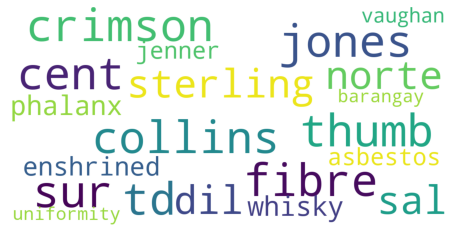

Topic #22:
0.044*"yard" + 0.026*"game" + 0.019*"touchdown" + 0.018*"season" + 0.018*"nfl" + 0.015*"bowl" + 0.013*"field" + 0.013*"first" + 0.013*"pas" + 0.012*"super" + 0.010*"quarter" + 0.010*"second" + 0.009*"lead" + 0.009*"goal" + 0.009*"quarterback" + 0.008*"play" + 0.008*"week" + 0.007*"line" + 0.007*"defensive" + 0.007*"back"


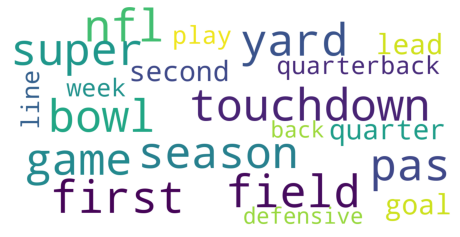

Topic #76:
0.104*"sweden" + 0.082*"swedish" + 0.077*"norway" + 0.073*"lake" + 0.071*"denmark" + 0.067*"danish" + 0.059*"norwegian" + 0.033*"dam" + 0.032*"iceland" + 0.028*"norse" + 0.023*"icelandic" + 0.023*"copenhagen" + 0.016*"scandinavian" + 0.014*"nordic" + 0.013*"scandinavia" + 0.013*"germanic" + 0.012*"graves" + 0.012*"hook" + 0.011*"christian" + 0.011*"saxon"


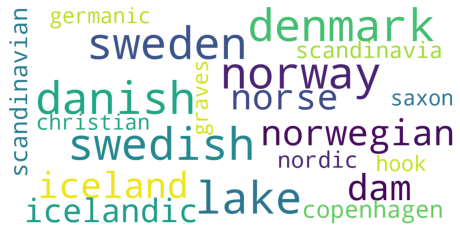

Topic #37:
0.016*"john" + 0.013*"david" + 0.013*"michael" + 0.010*"james" + 0.007*"jack" + 0.007*"brown" + 0.007*"peter" + 0.006*"tom" + 0.006*"paul" + 0.006*"scott" + 0.006*"martin" + 0.006*"tony" + 0.005*"taylor" + 0.005*"frank" + 0.005*"robert" + 0.005*"bill" + 0.005*"richard" + 0.005*"bob" + 0.005*"steve" + 0.005*"joe"


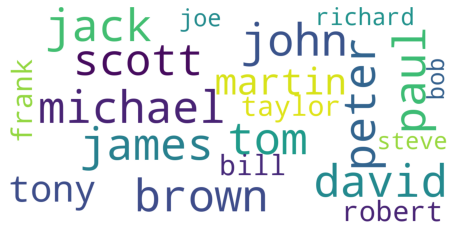

Topic #50:
0.012*"ha" + 0.008*"get" + 0.008*"one" + 0.008*"go" + 0.007*"take" + 0.006*"make" + 0.006*"find" + 0.006*"love" + 0.006*"back" + 0.006*"tell" + 0.006*"said" + 0.005*"come" + 0.005*"friend" + 0.005*"time" + 0.005*"like" + 0.005*"see" + 0.005*"say" + 0.004*"end" + 0.004*"however" + 0.004*"man"


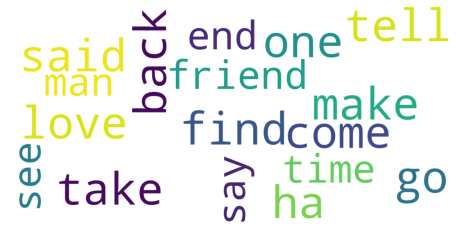

Topic #34:
0.021*"would" + 0.015*"time" + 0.013*"later" + 0.011*"year" + 0.010*"could" + 0.010*"one" + 0.008*"first" + 0.008*"became" + 0.008*"made" + 0.007*"two" + 0.007*"day" + 0.007*"took" + 0.006*"left" + 0.006*"death" + 0.006*"died" + 0.005*"began" + 0.005*"early" + 0.005*"many" + 0.005*"however" + 0.004*"went"


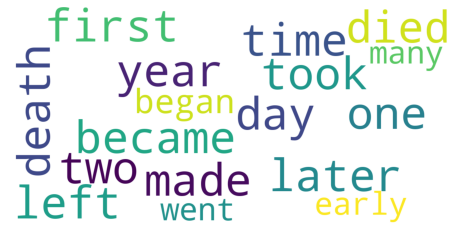

In [ ]:
LDAModeler.show_lda_topics_as_cloud(lda_model)

## Search for best number of topics of LDA Model based on Coherence measure

In [ ]:
num_topics = [50, 100, 200, 300]
pd_lda_results = LDAModeler.tune_hyperparams(num_topics)
print(pd_lda_results)

Num of topics: 50  Coherence measure:  0.5570257057724148
Num of topics: 100  Coherence measure:  0.5409791000545022
Num of topics: 200  Coherence measure:  0.5368684273879141
Num of topics: 300  Coherence measure:  0.5394347619325405


In [ ]:
pd_lda_results.to_csv('/content/drive/MyDrive/FU_NLP_Project/lda_results.csv', sep = '|')

Coherence score value by тumber of topic of the LDA model


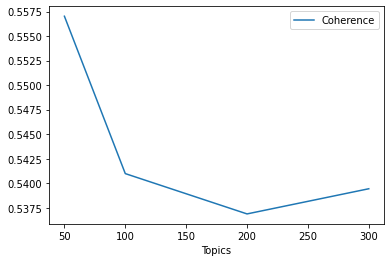

In [ ]:
print("Coherence score value by тumber of topic of the LDA model")
pd_lda_results.plot(x="Topics", y="Coherence")
plt.show()

In [ ]:
best_num_topics = pd_lda_results.loc[pd_lda_results['Coherence'].idxmax(), 'Topics']

## LDA Model with the highest Coherence measure (Number of topics = 50)

In [ ]:
lda_model_opt = LDAModeler.create_lda_model(num_topics = best_num_topics)

In [ ]:
CV_opt = LDAModeler.compute_coherence(lda_model_opt)
print("Coherence measure for LDA model with " ,lda_model_opt.num_topics,": " ,CV_opt)

Coherence measure for LDA model with  50 :  0.5926856190430747


In [ ]:
res_df = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')
res_df.drop(['Unnamed: 0'], axis = 1, inplace = True)
res_df = res_df.append({'model': 'LDA',
                        'num_topics': lda_model_opt.num_topics,  'c_v': CV_opt} , 
                    ignore_index=True)
res_df.to_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')

In [ ]:
LDAModeler.show_lda_topics_as_text(lda_model_opt)

0: white black red color blue horse dog cat puerto breed
1: school university student college education program ha year research campus
2: series episode show season television character doctor first tv appeared
3: airport international airline flight brazil brazilian malay airlines portuguese malaysia
4: court law case police act may state report legal crime
5: population century island people land region th many province area
6: may disease patient ha treatment cell study effect drug cause
7: air aircraft ship flight first pilot mission two wing navy
8: specie animal tree plant bird ha fish found female may
9: used use often usually made may one design many type
10: century th period temple known ancient one stone ha found
11: bank tax rate price market government cost country economic financial
12: engine car model vehicle new design production version v mm
13: building house street hall room store built new design construction
14: city area town park ha road district located county

Topic #22:
0.026*"season" + 0.024*"team" + 0.021*"game" + 0.013*"yard" + 0.012*"first" + 0.012*"football" + 0.011*"coach" + 0.009*"year" + 0.007*"record" + 0.007*"career" + 0.007*"played" + 0.007*"point" + 0.007*"bowl" + 0.007*"league" + 0.007*"second" + 0.006*"basketball" + 0.006*"player" + 0.006*"field" + 0.006*"touchdown" + 0.006*"nfl"


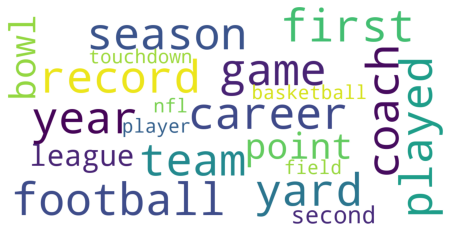

Topic #4:
0.065*"airport" + 0.031*"international" + 0.023*"airline" + 0.023*"flight" + 0.019*"brazil" + 0.017*"brazilian" + 0.016*"malay" + 0.016*"airlines" + 0.015*"portuguese" + 0.014*"malaysia" + 0.013*"terminal" + 0.013*"passenger" + 0.012*"rio" + 0.012*"air" + 0.012*"singapore" + 0.012*"ha" + 0.012*"da" + 0.010*"runway" + 0.010*"thai" + 0.008*"cuban"


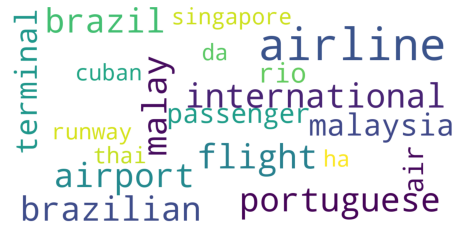

Topic #25:
0.123*"game" + 0.053*"player" + 0.015*"series" + 0.015*"card" + 0.014*"ball" + 0.013*"play" + 0.013*"baseball" + 0.012*"run" + 0.010*"major" + 0.010*"hit" + 0.009*"league" + 0.008*"one" + 0.008*"home" + 0.008*"first" + 0.008*"played" + 0.008*"two" + 0.007*"score" + 0.006*"ha" + 0.006*"level" + 0.006*"inning"


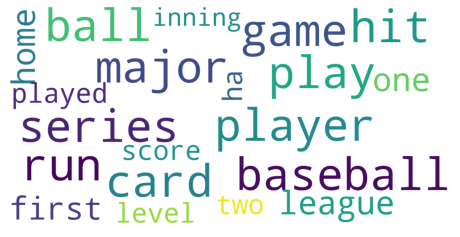

Topic #34:
0.011*"king" + 0.010*"year" + 0.009*"son" + 0.008*"later" + 0.008*"death" + 0.008*"family" + 0.007*"died" + 0.007*"became" + 0.007*"time" + 0.006*"first" + 0.006*"would" + 0.005*"royal" + 0.005*"father" + 0.005*"war" + 0.004*"john" + 0.004*"ii" + 0.004*"william" + 0.004*"took" + 0.004*"two" + 0.004*"one"


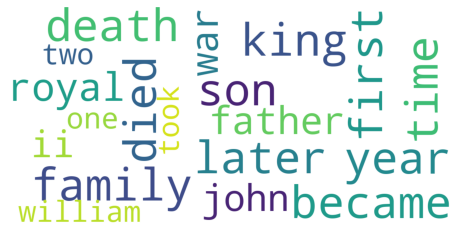

Topic #28:
0.016*"would" + 0.015*"said" + 0.012*"one" + 0.011*"time" + 0.008*"like" + 0.006*"day" + 0.006*"people" + 0.006*"make" + 0.005*"say" + 0.005*"could" + 0.005*"even" + 0.005*"stated" + 0.005*"never" + 0.005*"review" + 0.004*"saying" + 0.004*"way" + 0.004*"get" + 0.004*"good" + 0.004*"much" + 0.004*"gave"


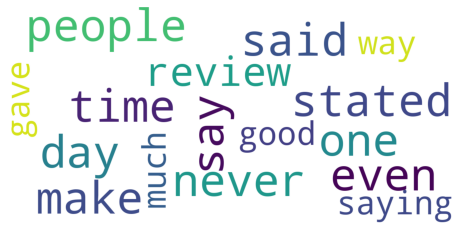

Topic #37:
0.012*"new" + 0.008*"john" + 0.008*"york" + 0.007*"american" + 0.006*"later" + 0.006*"year" + 0.005*"born" + 0.005*"california" + 0.005*"smith" + 0.005*"james" + 0.005*"early" + 0.004*"life" + 0.004*"los" + 0.004*"angeles" + 0.004*"david" + 0.004*"career" + 0.004*"first" + 0.004*"began" + 0.004*"michael" + 0.004*"city"


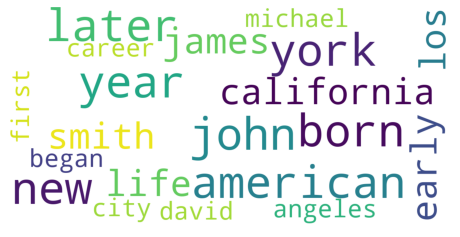

In [ ]:
LDAModeler.show_lda_topics_as_cloud(lda_model_opt)

# BERTopic model (Distilbert Embeddings)

## Embeddings

In [ ]:
articles = data['article'].tolist()

In [ ]:
norm_articles = data['normalized_article'].tolist()

In [ ]:
sentence_model = SentenceTransformer('distilbert-base-nli-mean-tokens')
embeddings = sentence_model.encode(articles, show_progress_bar=True)

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.99k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/265M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/450 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1563 [00:00<?, ?it/s]

In [ ]:
#with open('/content/drive/MyDrive/FU_NLP_Project/models/sentence_model_embeddings', 'wb') as SM_embeddings_file:
#    pickle.dump(embeddings, SM_embeddings_file)

In [ ]:
with open ('/content/drive/MyDrive/FU_NLP_Project/models/sentence_model_embeddings', 'rb') as SM_embeddings_file:
    embeddings = pickle.load(SM_embeddings_file)

## Topic model

In [ ]:
BERT_model = BERTopic(language="English") 
BERT_topics, BERT_probabilities = BERT_model.fit_transform(articles, embeddings)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


In [ ]:
#topic -1 represents outliers
BERT_model.get_topic_freq().head(10)

,Topic,Count
0,-1,22290
1,0,789
2,1,724
3,2,695
4,3,612
5,4,594
6,5,575
7,6,535
8,7,520
9,8,421


In [ ]:
#BERT_model.save('/content/drive/MyDrive/FU_NLP_Project/models/BERTopic_model_')

In [ ]:
#BERT_model = BERTopic.load('/content/drive/MyDrive/FU_NLP_Project/models/BERTopic_model_')

In [ ]:
BERT_model.visualize_topics()

## Dimensionality reduction and clusterization

In [ ]:
import umap.umap_ as umap
umap_embeddings = umap.UMAP(n_neighbors=25, 
                            n_components=8, 
                            metric='cosine').fit_transform(embeddings)

In [ ]:
import hdbscan
cluster = hdbscan.HDBSCAN(min_cluster_size=25,
                          metric='euclidean',                      
                          cluster_selection_method='eom').fit(umap_embeddings)

In [ ]:
def visualize_clusters(embeddings, cluster, model_name, n_neighbors = 15):
    umap_data = umap.UMAP(n_neighbors=n_neighbors, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
    df_clusters = pd.DataFrame(umap_data, columns=['x', 'y'])
    df_clusters['labels'] = cluster.labels_
    file_name = "df_clusters_" + model_name + '.csv'
    df_clusters.to_csv(os.path.join('/content/drive/MyDrive/FU_NLP_Project/',file_name), sep = '|')

    # Visualize clusters
    fig, ax = plt.subplots(figsize=(20, 10))
    outliers = df_clusters.loc[df_clusters.labels == -1, :]
    clustered = df_clusters.loc[df_clusters.labels != -1, :]
    plt.scatter(outliers.x, outliers.y, color='#BDBDBD', s=0.05)
    plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=0.05, cmap='hsv_r')
    plt.colorbar()
    return df_clusters

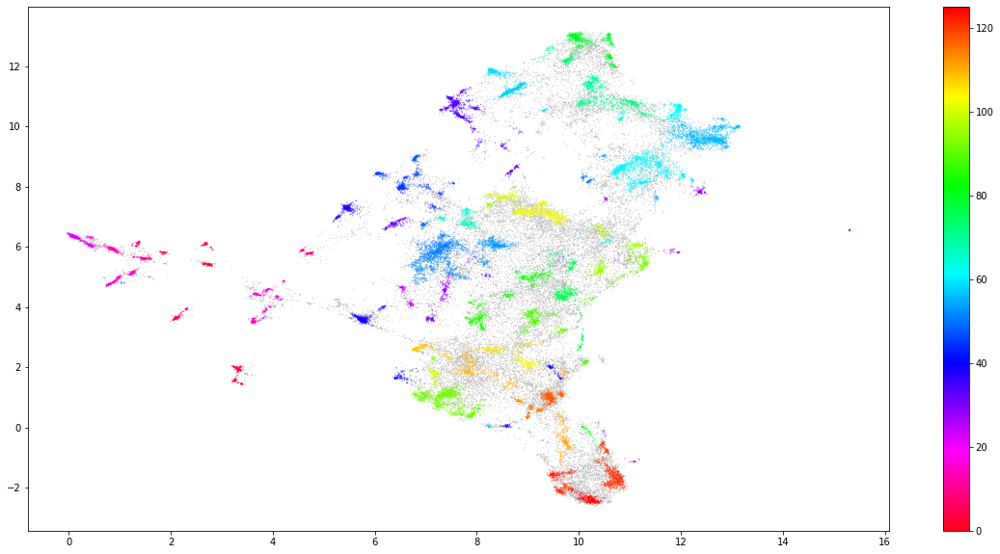

In [ ]:
df_clusters = visualize_clusters(embeddings, cluster, "BERTopic_sent_em")

In [ ]:
df_clusters['labels'].value_counts()

-1      25443
 51      1507
 56      1425
 92      1345
 61      1296
        ...  
 124       28
 99        26
 68        26
 43        26
 44        25
Name: labels, Length: 127, dtype: int64

In [41]:
df_clusters.head()

,x,y,labels
0,9.865012,6.597284,-1
1,7.155471,2.229500,-1
2,8.313556,6.195441,53
3,10.505173,6.514494,98
4,3.396368,1.427240,4


## Topic model assessment based on Coherence measure

In [ ]:
def compute_coherence_values_BERT(BERT_model, BERT_topics, articles):
    # Preprocess documents
    cleaned_docs = BERT_model._preprocess_text(articles)

    # Extract vectorizer and tokenizer from BERTopic
    vectorizer = BERT_model.vectorizer_model
    tokenizer = vectorizer.build_tokenizer()

    # Extract features for Topic Coherence evaluation
    words = vectorizer.get_feature_names()
    tokens = [tokenizer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]
    topic_words = [[words for words, _ in BERT_model.get_topic(topic)] 
                for topic in range(len(set(BERT_topics))-1)]
    coherence_model_nmpi = CoherenceModel(topics=topic_words, 
                                 texts=tokens, 
                                 corpus=corpus,
                                 dictionary=dictionary, 
                                 coherence='c_v')
    return coherence_model_nmpi.get_coherence()

In [ ]:
BERT_coherence = compute_coherence_values_BERT(BERT_model,BERT_topics, articles)
print('BERTopic model with SentenceTransformer Embeddings:', BERT_coherence)

BERTopic model with SentenceTransformer Embeddings: 0.5595086546887169


In [42]:
res_df = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')
res_df.drop(['Unnamed: 0'], axis = 1, inplace = True)
res_df = res_df.append({'model': 'BERTopic (Distilbert Embeddings)',
                        'num_topics': df_clusters['labels'].nunique(),  'c_npmi': BERT_coherence} , 
                    ignore_index=True)
res_df.to_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')

## Representation of topics

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/data/wiki_sample_normalized_small.csv', sep = '|')
data.drop(['Unnamed: 0'], axis = 1, inplace = True)
data.head()

,id,article,normalized_article,tokens
0,wikipedia-4592186,"Sheikhupura District Shaikhupur District (),...",sheikhupura district shaikhupur district distr...,"['sheikhupura', 'district', 'shaikhupur', 'dis..."
1,wikipedia-28634877,Isaac and Miria Numerous publications in var...,isaac miria numerous publication various mediu...,"['isaac', 'miria', 'numerous', 'publication', ..."
2,wikipedia-2319918,Stewart's Melville College Stewart's Melvill...,stewarts melville college stewarts melville co...,"['stewarts', 'melville', 'college', 'stewarts'..."
3,wikipedia-1788535,Khas people Originally the Khas (खस) / Khasa...,khas people originally khas khasas khasiyas mo...,"['khas', 'people', 'originally', 'khas', 'khas..."
4,wikipedia-19727355,Nicole Matthews Nicole Matthews (born Januar...,nicole matthews nicole matthews born january c...,"['nicole', 'matthews', 'nicole', 'matthews', '..."


In [43]:
df_clusters = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/df_clusters_BERTopic_sent_em.csv', sep = '|')
df_clusters.drop(['Unnamed: 0'], axis = 1, inplace = True)
df_clusters.head()

,x,y,labels
0,9.865012,6.597284,-1
1,7.155471,2.229500,-1
2,8.313556,6.195441,53
3,10.505173,6.514494,98
4,3.396368,1.427241,4


In [44]:
data['clusters_BERT1'] = df_clusters['labels']

In [45]:
articles_per_topic = data.groupby(['clusters_BERT1'], as_index = False).agg({'normalized_article': ' '.join})

In [46]:
#implementation of c_tf_idf from https://towardsdatascience.com/topic-modeling-with-bert-779f7db187e6
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

def c_tf_idf(documents, m, ngram_range=(1, 1)):
    count = CountVectorizer(ngram_range=ngram_range).fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)

    return tf_idf, count

In [47]:
tf_idf, count = c_tf_idf(articles_per_topic.normalized_article.values, m=data.shape[0])

In [48]:
#implementation of c_tf_idf from https://towardsdatascience.com/topic-modeling-with-bert-779f7db187e6
def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic,topic_column_name, n=12):
    words = count.get_feature_names()
    labels = list(docs_per_topic[topic_column_name])
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

In [49]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, articles_per_topic,topic_column_name = 'clusters_BERT1',  n=20)

In [50]:
df_clusters['labels'].value_counts()

-1      25443
 51      1507
 56      1425
 92      1345
 61      1296
        ...  
 124       28
 99        26
 68        26
 43        26
 44        25
Name: labels, Length: 127, dtype: int64

In [51]:
df_top_clusters = df_clusters['labels'].value_counts().rename_axis('labels').reset_index(name='num_of_docs')
df_top_clusters.sort_values(by = ['num_of_docs'], axis=0, inplace = True, ascending=False)

In [52]:
df_top_clusters.head()

,labels,num_of_docs
0,-1,25443
1,51,1507
2,56,1425
3,92,1345
4,61,1296


In [53]:
df_top_clusters.tail()

,labels,num_of_docs
122,124,28
123,99,26
124,68,26
125,43,26
126,44,25


In [54]:
df_top_clusters.loc[df_top_clusters.shape[0]-3:df_top_clusters.shape[0]-1,'labels']

124    68
125    43
126    44
Name: labels, dtype: int64

In [56]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(8, 8))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=14)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)

Label:  51 . Number of documents:  1507 . Top words:
[('store', 0.00424042766913416), ('billion', 0.004020673241251718), ('business', 0.003377180403036131), ('product', 0.0033221194155787334), ('acquired', 0.0032818744372741107), ('market', 0.003257798193407975), ('bank', 0.0032379221332668206), ('subsidiary', 0.003232954361573263), ('brand', 0.003221335509731238), ('investment', 0.0032198147347949325), ('corporation', 0.002973174676669359), ('customer', 0.0029562225112114665), ('company', 0.002873637736251832), ('stock', 0.0027195133903871686), ('firm', 0.0026658567926287667), ('share', 0.0026125886258965996), ('inc', 0.0025880285944680334), ('channel', 0.002583728307982675), ('million', 0.002572750827661072), ('sale', 0.0025601372496155688)]


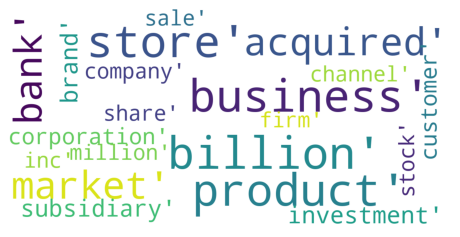

Label:  56 . Number of documents:  1425 . Top words:
[('file', 0.00954710280473522), ('windows', 0.009103805661456072), ('user', 0.00813272418522834), ('software', 0.0077593959829999485), ('server', 0.007325931400160168), ('data', 0.006732948740121875), ('codice', 0.006466287053820085), ('application', 0.006026553399603356), ('bit', 0.005838321839747272), ('computer', 0.00544228941143918), ('interface', 0.005380775880144557), ('web', 0.005263461135185799), ('processor', 0.005236518243629613), ('code', 0.004992928609480067), ('operating', 0.004481276813688164), ('memory', 0.00446428901101015), ('os', 0.004457538862494264), ('microsoft', 0.004401189809379032), ('device', 0.004345686618789949), ('disk', 0.0041424794272565185)]


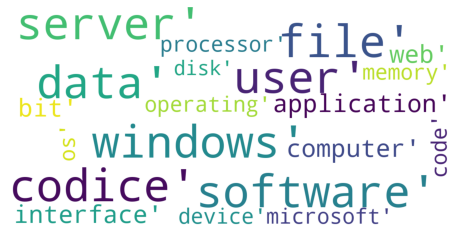

Label:  92 . Number of documents:  1345 . Top words:
[('actor', 0.008606717757101893), ('comedy', 0.006549373895488312), ('starred', 0.0052554733931791395), ('movie', 0.005139214695452857), ('role', 0.004900498522913667), ('appeared', 0.0044552273651302194), ('directed', 0.004138974491855712), ('television', 0.003770181060698682), ('drama', 0.0037661000733678262), ('starring', 0.0036679572612175163), ('acting', 0.003537022695347722), ('director', 0.0032180327659783697), ('cast', 0.003215906476255466), ('theatre', 0.0032016193917777627), ('episode', 0.003162606230081731), ('tv', 0.002850635243698275), ('comedian', 0.0027487078086804637), ('award', 0.002724804353431906), ('bollywood', 0.0026715777014471435), ('born', 0.0025381145294039505)]


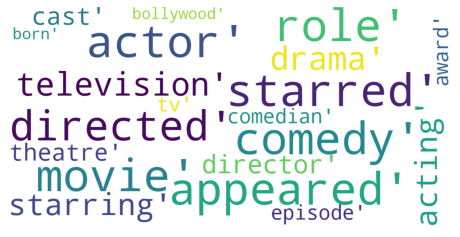

In [57]:
for label, num in zip(df_top_clusters.loc[1:3,'labels'].tolist(), df_top_clusters.loc[1:3,'num_of_docs'].tolist()):
    print("Label: ", label, ". Number of documents: ", num, ". Top words:")
    print(top_n_words[label])
    show_wordcloud(top_n_words[label])
    plt.show()

Label:  68 . Number of documents:  26 . Top words:
[('building', 0.02135401670261572), ('fbi', 0.020872753735286652), ('gsa', 0.01861714542887338), ('hoover', 0.0182487620126304), ('transbay', 0.01477225486017635), ('construction', 0.013162942823795902), ('tower', 0.012006346013429162), ('airport', 0.010922376078410978), ('avenue', 0.010823743311451967), ('floor', 0.009929403538564951), ('edgar', 0.00980804811203235), ('hotel', 0.009569601313985114), ('pennsylvania', 0.009562679769223616), ('macau', 0.008420253289066603), ('nw', 0.00790893492215553), ('project', 0.0076440240685213086), ('ncpc', 0.007635740219696527), ('stele', 0.007477460835142953), ('christchurch', 0.007317921120017548), ('parcel', 0.007179314039737144)]


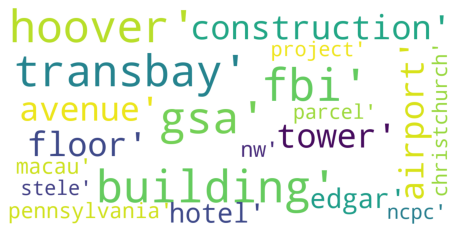

Label:  43 . Number of documents:  26 . Top words:
[('locomotive', 0.07689209576318642), ('class', 0.03754140299954116), ('train', 0.028432651937110975), ('trains', 0.01947699137375701), ('livery', 0.01747271144073257), ('rail', 0.017446638404196066), ('unit', 0.011813827895555646), ('railways', 0.010675520012229012), ('fleet', 0.010671233035475477), ('freight', 0.010628275955622782), ('diesel', 0.010107897996421108), ('steam', 0.009949653525124781), ('railroad', 0.009792805370770187), ('ews', 0.009601861129256546), ('locos', 0.009567134543155931), ('passenger', 0.009344744477768094), ('db', 0.009118117535823762), ('railway', 0.009011168474999356), ('engine', 0.008968094716742857), ('br', 0.008931825972775915)]


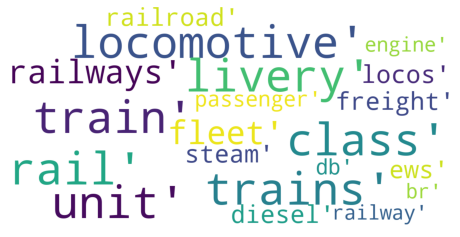

Label:  44 . Number of documents:  25 . Top words:
[('insignia', 0.03126869408880962), ('uniform', 0.028833758876426977), ('badge', 0.02555272266381135), ('officer', 0.019499574575079344), ('rating', 0.018805376288607838), ('ribbon', 0.018257632738537612), ('rank', 0.01781878140546037), ('enlisted', 0.017112908086201077), ('worn', 0.016021858658553843), ('navy', 0.01567152312685442), ('boatswain', 0.015503940161503773), ('forces', 0.01424014239740748), ('fleet', 0.013807481963337824), ('bdu', 0.013362325832859344), ('usaf', 0.012795646377657335), ('admiral', 0.012662424901254318), ('marine', 0.012524011475732929), ('corps', 0.012427651614797895), ('wear', 0.012346030023888028), ('naval', 0.012239314034872197)]


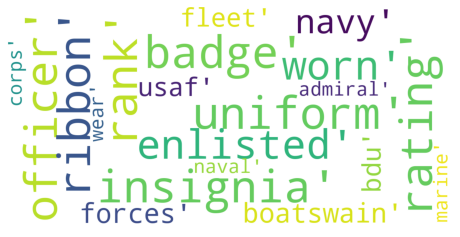

In [58]:
for label, num in zip(df_top_clusters.loc[df_top_clusters.shape[0]-3:df_top_clusters.shape[0]-1,'labels'].tolist(), df_top_clusters.loc[df_top_clusters.shape[0]-3:df_top_clusters.shape[0]-1,'num_of_docs'].tolist()):
    print("Label: ", label, ". Number of documents: ", num, ". Top words:")
    print(top_n_words[label])
    show_wordcloud(top_n_words[label])
    plt.show()

# BERTopic model (BERT all-MiniLM Embeddings)

## Embeddings

In [62]:
embedding_model2 = SentenceTransformer("all-MiniLM-L6-v2")

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
embeddings2 = embedding_model2.encode(norm_articles, show_progress_bar=True)

Batches:   0%|          | 0/1563 [00:00<?, ?it/s]

In [ ]:
with open('/content/drive/MyDrive/FU_NLP_Project/models/sentence_model_embeddings2', 'wb') as SM_embeddings_file:
    pickle.dump(embeddings2, SM_embeddings_file)

In [59]:
with open ('/content/drive/MyDrive/FU_NLP_Project/models/sentence_model_embeddings2', 'rb') as SM_embeddings_file:
    embeddings2 = pickle.load(SM_embeddings_file)

## Topic model

In [63]:
#model all-MiniLM-L6-v2 with high speed and good perormance
#https://www.sbert.net/docs/pretrained_models.html

BERT_model2 = BERTopic(language="English", embedding_model=embedding_model2)
BERT_topics2, BERT_probabilities2 = BERT_model2.fit_transform(norm_articles, embeddings2)

In [64]:
BERT_model2.get_topic_freq().head(10)

,Topic,Count
0,-1,18464
1,0,1579
2,1,755
3,2,752
4,3,638
5,4,567
6,5,424
7,6,397
8,7,374
9,8,335


In [ ]:
#BERT_model2.save('/content/drive/MyDrive/FU_NLP_Project/models/BERTopic_model2')

In [ ]:
#BERT_model2 = BERTopic2.load('/content/drive/MyDrive/FU_NLP_Project/models/BERTopic_model2')

In [65]:
BERT_model2.visualize_topics()

## Dimensionality reduction and clusterization

In [66]:
umap_embeddings2 = umap.UMAP(n_neighbors=25, 
                            n_components=5, 
                            metric='cosine').fit_transform(embeddings2)

In [67]:
cluster2 = hdbscan.HDBSCAN(min_cluster_size=25,
                          metric='euclidean',                      
                          cluster_selection_method='eom').fit(umap_embeddings2)

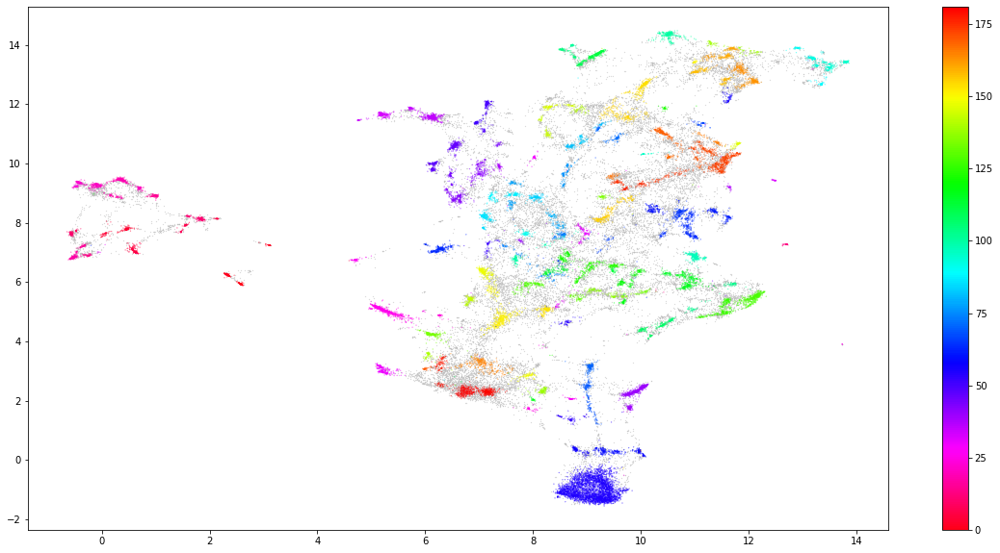

In [68]:
df_clusters2 = visualize_clusters(embeddings2, cluster2, "BERTopic_sent_em2")

In [69]:
df_clusters2['labels'].value_counts()

-1      24857
 55      3548
 40       728
 63       657
 26       644
        ...  
 157       26
 117       26
 37        26
 111       26
 41        25
Name: labels, Length: 183, dtype: int64

## Topic model assessment based on Coherence measure

In [70]:
BERT_coherence2 = compute_coherence_values_BERT(BERT_model2, BERT_topics2, norm_articles)
print('BERTopic model with SentenceTransformer Embeddings all-MiniLM-L6-v2:', BERT_coherence2)

BERTopic model with SentenceTransformer Embeddings all-MiniLM-L6-v2: 0.7223805090621183


In [83]:
res_df = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')
res_df.drop(['Unnamed: 0'], axis = 1, inplace = True)
res_df = res_df.append({'model': 'BERTopic (BERT Embeddings all-MiniLM-L6-v2)',
                        'num_topics': df_clusters2['labels'].nunique(),  'c_v': BERT_coherence2} , 
                    ignore_index=True)
res_df.to_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')

## Representation of topics

In [72]:
data = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/data/wiki_sample_normalized_small.csv', sep = '|')
data.drop(['Unnamed: 0'], axis = 1, inplace = True)
data.head()

,id,article,normalized_article,tokens
0,wikipedia-4592186,"Sheikhupura District Shaikhupur District (),...",sheikhupura district shaikhupur district distr...,"['sheikhupura', 'district', 'shaikhupur', 'dis..."
1,wikipedia-28634877,Isaac and Miria Numerous publications in var...,isaac miria numerous publication various mediu...,"['isaac', 'miria', 'numerous', 'publication', ..."
2,wikipedia-2319918,Stewart's Melville College Stewart's Melvill...,stewarts melville college stewarts melville co...,"['stewarts', 'melville', 'college', 'stewarts'..."
3,wikipedia-1788535,Khas people Originally the Khas (खस) / Khasa...,khas people originally khas khasas khasiyas mo...,"['khas', 'people', 'originally', 'khas', 'khas..."
4,wikipedia-19727355,Nicole Matthews Nicole Matthews (born Januar...,nicole matthews nicole matthews born january c...,"['nicole', 'matthews', 'nicole', 'matthews', '..."


In [73]:
df_clusters = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/df_clusters_BERTopic_sent_em2.csv', sep = '|')
df_clusters.drop(['Unnamed: 0'], axis = 1, inplace = True)
df_clusters.head()

,x,y,labels
0,11.730777,5.516455,-1
1,6.810685,2.430269,-1
2,6.323344,7.122816,63
3,11.859502,5.485557,-1
4,2.588744,5.941892,0


In [74]:
data['clusters_BERT2'] = df_clusters['labels']

In [75]:
articles_per_topic = data.groupby(['clusters_BERT2'], as_index = False).agg({'normalized_article': ' '.join})

In [76]:
tf_idf, count = c_tf_idf(articles_per_topic.normalized_article.values, m=data.shape[0])

In [77]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, articles_per_topic,topic_column_name = 'clusters_BERT2',  n=20)

In [78]:
#3 topics with max number of articles and min number of articles:
df_top_clusters = df_clusters['labels'].value_counts().rename_axis('labels').reset_index(name='num_of_docs')
df_top_clusters.sort_values(by = ['num_of_docs'], axis=0, inplace = True, ascending=False)

In [79]:
df_top_clusters.head()

,labels,num_of_docs
0,-1,24857
1,55,3548
2,40,728
3,63,657
4,26,644


In [80]:
df_top_clusters.tail()

,labels,num_of_docs
178,157,26
179,117,26
180,37,26
181,111,26
182,41,25


Label:  55 . Number of documents:  3548 . Top words:
[('band', 0.006528280085652675), ('chart', 0.006195787696721965), ('records', 0.005555985223255401), ('tour', 0.004878742923044335), ('album', 0.004844808708454931), ('recording', 0.0047388641072521115), ('track', 0.004723385551958074), ('song', 0.004646840078602968), ('guitar', 0.004386638894666968), ('rock', 0.004383698453675437), ('vocal', 0.004361601002168089), ('billboard', 0.0042839633166408455), ('label', 0.004088816990093202), ('single', 0.004084240934739057), ('recorded', 0.004050164154386086), ('studio', 0.0037861383198476957), ('solo', 0.0036764536986014897), ('release', 0.003581184664613294), ('hit', 0.0034951428932547086), ('music', 0.0034799746947255794)]


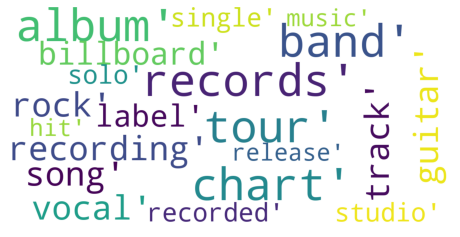

Label:  40 . Number of documents:  728 . Top words:
[('bollywood', 0.009493220478272555), ('movie', 0.007249785692782655), ('kapoor', 0.006884037761913823), ('hindi', 0.006804711745236249), ('actor', 0.006529062690654184), ('kumar', 0.006349664753899577), ('tamil', 0.0061510296137027186), ('telugu', 0.0059159691172428076), ('indian', 0.005858430202602228), ('khan', 0.0057607034551721255), ('directed', 0.005651485396709348), ('mumbai', 0.0054681635182618465), ('malayalam', 0.004841515980446132), ('actress', 0.004816179082610648), ('vijay', 0.004497732722392286), ('cinema', 0.004458603112180425), ('arjun', 0.004370106128359531), ('filmfare', 0.00425848922459596), ('ravi', 0.004170191820734313), ('director', 0.004050310482995024)]


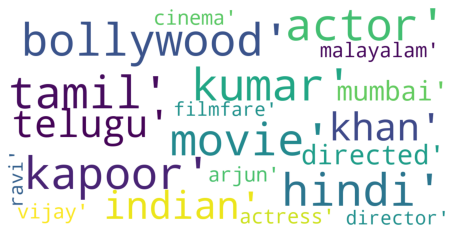

Label:  63 . Number of documents:  657 . Top words:
[('campus', 0.013992280434771654), ('student', 0.013882187498546967), ('college', 0.0098949900530627), ('education', 0.007854384920157581), ('faculty', 0.006965124708671659), ('academic', 0.006794831969513873), ('graduate', 0.0062385702337103745), ('university', 0.006125839567136061), ('undergraduate', 0.005651661954893206), ('learning', 0.005193913277370059), ('students', 0.004720800616357972), ('degree', 0.004624750927671833), ('program', 0.004555497819810555), ('science', 0.004496416314001403), ('engineering', 0.004483099123745331), ('course', 0.004136621014755463), ('curriculum', 0.004004534455332414), ('grade', 0.003994611533141447), ('institution', 0.00395326915929931), ('institute', 0.003907774879412482)]


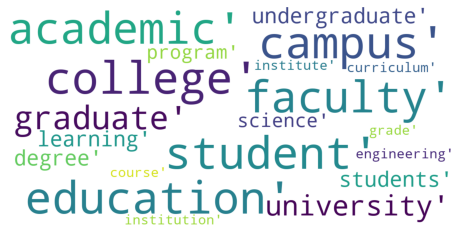

In [81]:
for label, num in zip(df_top_clusters.loc[1:3,'labels'].tolist(), df_top_clusters.loc[1:3,'num_of_docs'].tolist()):
    print("Label: ", label, ". Number of documents: ", num, ". Top words:")
    print(top_n_words[label])
    show_wordcloud(top_n_words[label])
    plt.show()

Label:  37 . Number of documents:  26 . Top words:
[('uv', 0.0215471743858587), ('font', 0.018412229701099455), ('usc', 0.016655771324783835), ('encoding', 0.01234538346447142), ('unicode', 0.011801404458868537), ('arizona', 0.01175124390535222), ('ultraviolet', 0.010557104972060674), ('utf', 0.010224337020496797), ('ua', 0.009734256499555895), ('glyph', 0.006907124293597554), ('gore', 0.00674857592383997), ('uvb', 0.005922990059791309), ('hkscs', 0.005912790305059613), ('campus', 0.005799716967037952), ('radiation', 0.0056032024071909076), ('ascii', 0.005419594071117167), ('ballot', 0.005417816011913847), ('uscs', 0.005360335060192494), ('bush', 0.005231880457246645), ('vote', 0.005168427727341919)]


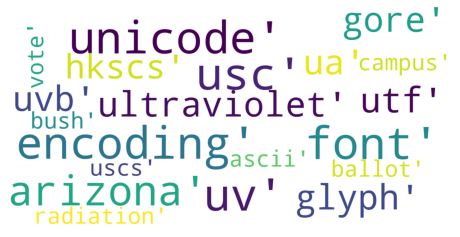

Label:  111 . Number of documents:  26 . Top words:
[('cream', 0.05313684426889561), ('candy', 0.05236554921585406), ('ice', 0.028933329818349465), ('chewits', 0.028613553399229927), ('twisties', 0.028613553399229927), ('chocolate', 0.02715517263653151), ('flavor', 0.022260943309802238), ('brand', 0.021139936185448762), ('mvenpick', 0.020631073714799764), ('sweetest', 0.018739312081929693), ('flavour', 0.018232782501481217), ('hubba', 0.017192561428999803), ('krembo', 0.016668620778217194), ('biscuit', 0.016221086340415653), ('nestl', 0.015778075895013743), ('fage', 0.01534746981269174), ('whippy', 0.014054180577215256), ('taffy', 0.013821442107433001), ('bubba', 0.012995335374148615), ('wrapper', 0.012854731900816194)]


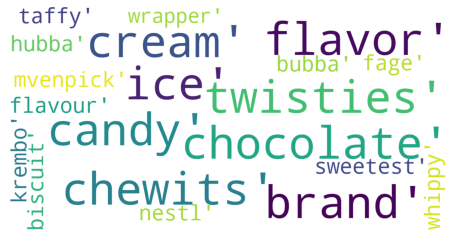

Label:  41 . Number of documents:  25 . Top words:
[('german', 0.018715742870127804), ('germans', 0.016377700414779286), ('division', 0.013033130179384634), ('panzer', 0.012877088920827307), ('tank', 0.012185919090003472), ('armoured', 0.011423097613914334), ('allied', 0.011335086461638557), ('attack', 0.010451474103250657), ('infantry', 0.010092382054480098), ('artillery', 0.010083357820035239), ('brigade', 0.009641310750173522), ('luftwaffe', 0.009182725597003786), ('counterattack', 0.009093875597589247), ('offensive', 0.008986461070379015), ('hindenburg', 0.008586036126534535), ('battle', 0.008125062946432263), ('french', 0.007761237145512986), ('advance', 0.007721734463235859), ('bomber', 0.007498315819225059), ('army', 0.007332081798513992)]


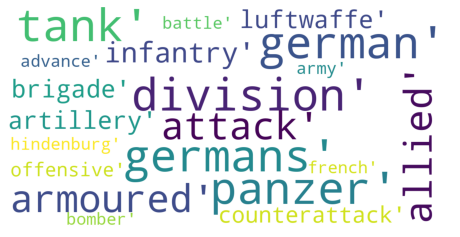

In [82]:
for label, num in zip(df_top_clusters.loc[df_top_clusters.shape[0]-3:df_top_clusters.shape[0]-1,'labels'].tolist(), df_top_clusters.loc[df_top_clusters.shape[0]-3:df_top_clusters.shape[0]-1,'num_of_docs'].tolist()):
    print("Label: ", label, ". Number of documents: ", num, ". Top words:")
    print(top_n_words[label])
    show_wordcloud(top_n_words[label])
    plt.show()

# Top2Vec

## Model creation

In [84]:
articles = data['article'].tolist()

In [85]:
norm_articles = data['normalized_article'].tolist()

In [ ]:
TTV_model = Top2Vec(norm_articles)

2021-10-01 09:29:18,927 - top2vec - INFO - Pre-processing documents for training
2021-10-01 09:31:05,669 - top2vec - INFO - Creating joint document/word embedding
2021-10-01 13:00:53,043 - top2vec - INFO - Creating lower dimension embedding of documents
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
2021-10-01 13:02:03,730 - top2vec - INFO - Finding dense areas of documents
2021-10-01 13:02:06,982 - top2vec - INFO - Finding topics


In [ ]:
TTV_model.save('/content/drive/MyDrive/FU_NLP_Project/models/Top2Vec_model')

In [86]:
TTV_model = Top2Vec.load('/content/drive/MyDrive/FU_NLP_Project/models/Top2Vec_model')

In [87]:
TTV_num_topics = TTV_model.get_num_topics()
TTV_num_topics

323

In [88]:
topic_sizes, topic_nums = TTV_model.get_topic_sizes()
print(topic_sizes[:10])  # get sizes of top 10 topics

[943 900 812 736 709 649 624 606 590 507]


Number of articles in the topic:  943
Number of articles in the topic:  900
Number of articles in the topic:  812
Number of articles in the topic:  736
Number of articles in the topic:  709


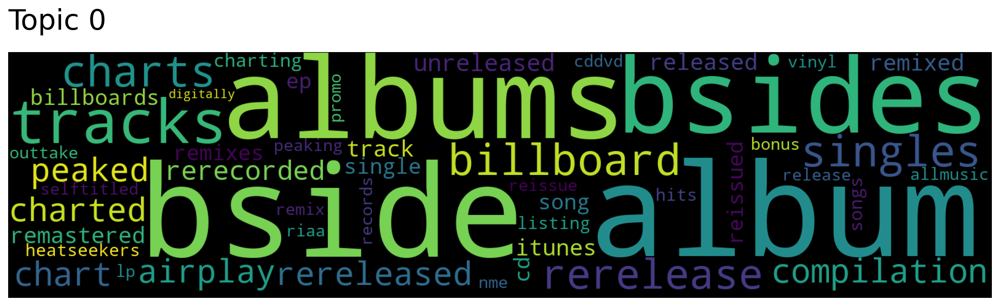

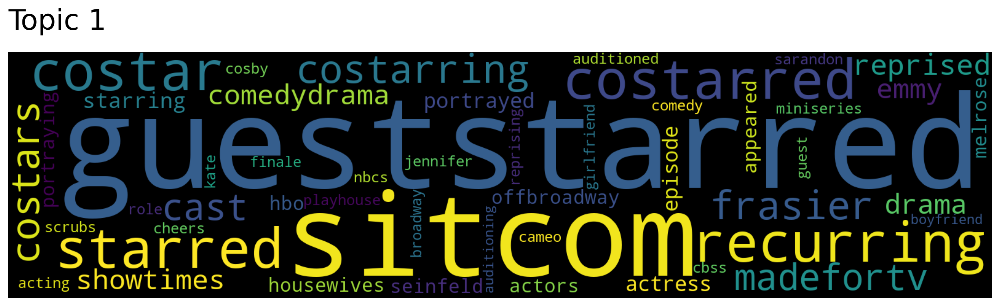

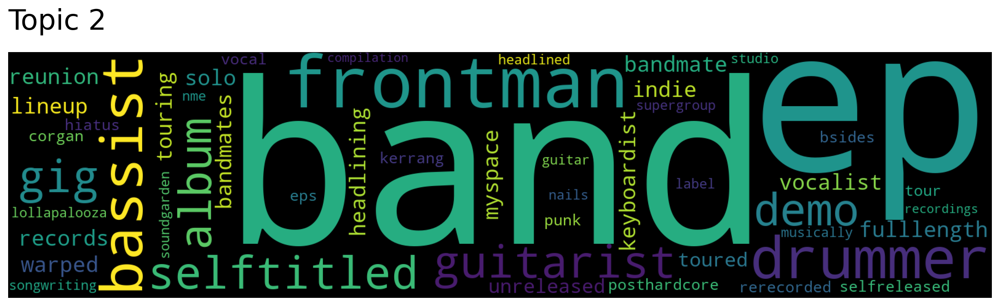

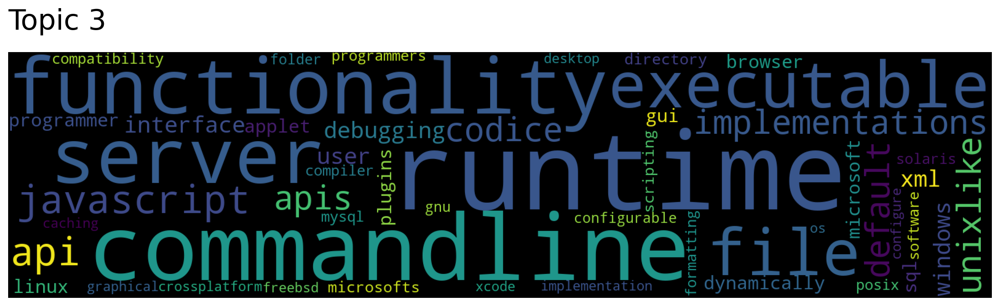

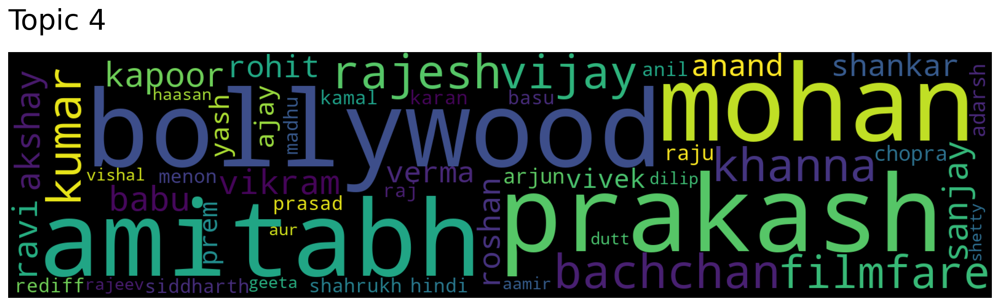

In [89]:
topic_words, word_scores, topic_nums = TTV_model.get_topics(TTV_num_topics)
for size, topic in zip(topic_sizes[:5], topic_nums[:5]):
    print("Number of articles in the topic: ", size)
    TTV_model.generate_topic_wordcloud(topic)

Number of articles in the topic:  34
Number of articles in the topic:  31
Number of articles in the topic:  31
Number of articles in the topic:  28
Number of articles in the topic:  17


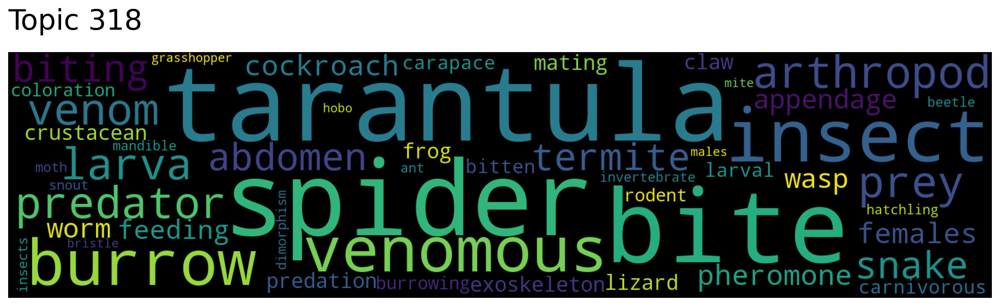

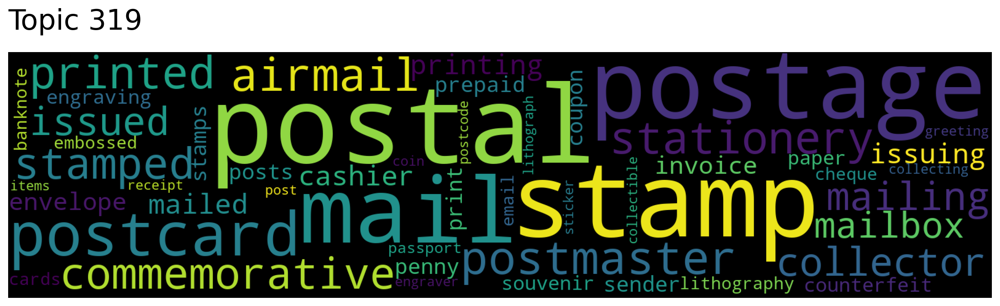

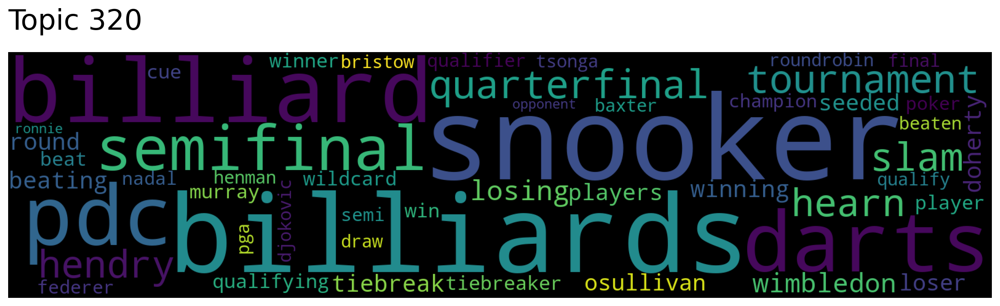

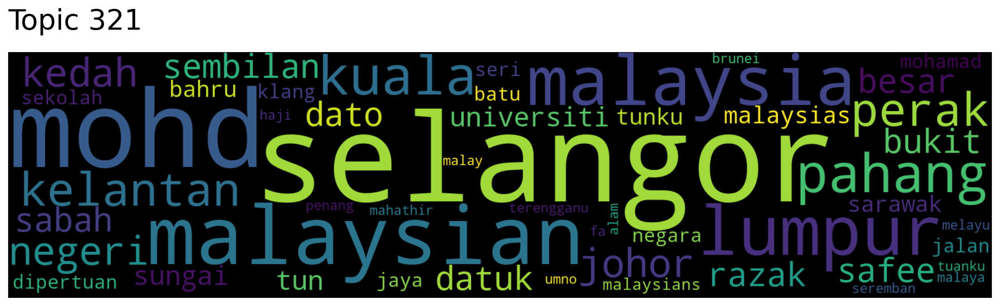

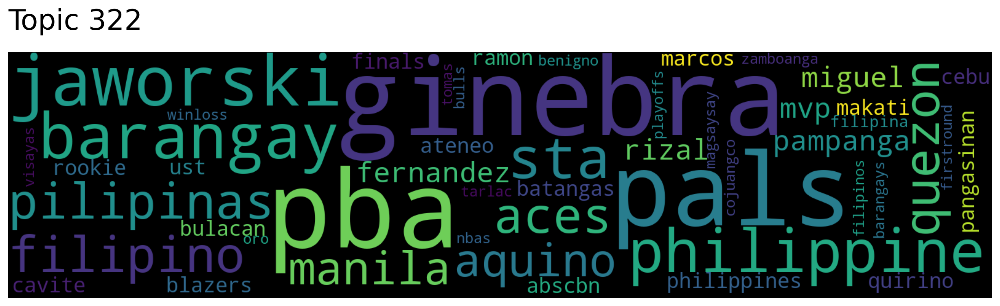

In [90]:
for size, topic in zip(topic_sizes[-5:], topic_nums[-5:]):
    print("Number of articles in the topic: ", size)
    TTV_model.generate_topic_wordcloud(topic)

## Dimensionality reduction and clustering

In [91]:
umap_embeddings_TTV = umap.UMAP(n_neighbors=15, 
                            n_components=5, 
                            metric='cosine').fit_transform(TTV_model._get_document_vectors(norm=False))

In [92]:
print(type(umap_embeddings_TTV))
print(umap_embeddings_TTV.shape)

<class 'numpy.ndarray'>
(50000, 5)


In [94]:
cluster_TTV = hdbscan.HDBSCAN(min_cluster_size=25,
                          metric='euclidean',                      
                          cluster_selection_method='eom').fit(umap_embeddings_TTV)

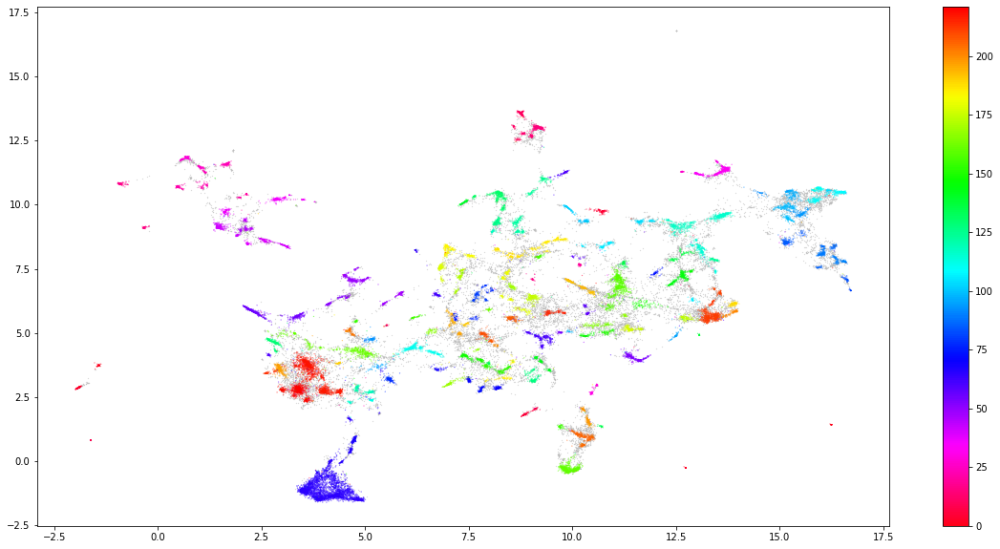

In [95]:
df_clusters_TTV = visualize_clusters(TTV_model._get_document_vectors(norm=False), cluster_TTV, "TopToVec")

In [96]:
df_clusters_TTV['labels'].value_counts()

-1      17772
 65      3603
 218      961
 160      783
 56       659
        ...  
 210       26
 168       26
 98        25
 200       25
 21        25
Name: labels, Length: 223, dtype: int64

## Model Assessment based on Coherence measure

In [97]:
import gensim.corpora as corpora
from gensim.utils import tokenize

tokenized = [list(tokenize(s)) for s in norm_articles]
id2word = corpora.Dictionary(tokenized)
corpus = [id2word.doc2bow(text) for text in tokenized]

TTV_coherence_2 = CoherenceModel(topics=[s.tolist() for s in topic_words] ,texts=tokenized
                    , corpus=corpus, dictionary=id2word, coherence='c_v')
        
print('Coherence value for Top2Vec model with default Embeddings:', TTV_coherence_2.get_coherence())

Coherence value for Top2Vec model with default Embeddings: 0.7862651854681738


In [98]:
res_df = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')
res_df.drop(['Unnamed: 0'], axis = 1, inplace = True)
res_df = res_df.append({'model': 'TopToVec',
                        'num_topics': df_clusters_TTV['labels'].nunique(),  'c_v': TTV_coherence_2.get_coherence()} , 
                    ignore_index=True)
res_df.to_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')

## Topics representation

In [99]:
data = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/data/wiki_sample_normalized_small.csv', sep = '|')
data.drop(['Unnamed: 0'], axis = 1, inplace = True)
data.head()

,id,article,normalized_article,tokens
0,wikipedia-4592186,"Sheikhupura District Shaikhupur District (),...",sheikhupura district shaikhupur district distr...,"['sheikhupura', 'district', 'shaikhupur', 'dis..."
1,wikipedia-28634877,Isaac and Miria Numerous publications in var...,isaac miria numerous publication various mediu...,"['isaac', 'miria', 'numerous', 'publication', ..."
2,wikipedia-2319918,Stewart's Melville College Stewart's Melvill...,stewarts melville college stewarts melville co...,"['stewarts', 'melville', 'college', 'stewarts'..."
3,wikipedia-1788535,Khas people Originally the Khas (खस) / Khasa...,khas people originally khas khasas khasiyas mo...,"['khas', 'people', 'originally', 'khas', 'khas..."
4,wikipedia-19727355,Nicole Matthews Nicole Matthews (born Januar...,nicole matthews nicole matthews born january c...,"['nicole', 'matthews', 'nicole', 'matthews', '..."


In [100]:
df_clusters_TTV = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/df_clusters_TopToVec.csv', sep = '|')
df_clusters_TTV.drop(['Unnamed: 0'], axis = 1, inplace = True)
df_clusters_TTV.head()

,x,y,labels
0,9.931188,1.245186,-1
1,3.361024,5.656955,55
2,9.826506,7.123406,-1
3,10.171938,1.256017,-1
4,-1.419496,3.756508,1


In [101]:
data['clusters_Top2Vec'] = df_clusters_TTV['labels']

In [102]:
articles_per_topic = data.groupby(['clusters_Top2Vec'], as_index = False).agg({'normalized_article': ' '.join})

In [103]:
tf_idf, count = c_tf_idf(articles_per_topic.normalized_article.values, m=data.shape[0])

In [104]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, articles_per_topic,topic_column_name = 'clusters_Top2Vec',  n=20)

In [105]:
#3 topics with max number of articles and min number of articles:
df_top_clusters = df_clusters_TTV['labels'].value_counts().rename_axis('labels').reset_index(name='num_of_docs')
df_top_clusters.sort_values(by = ['num_of_docs'], axis=0, inplace = True, ascending=False)

Label:  65 . Number of documents:  3603 . Top words:
[('chart', 0.006387145846664046), ('band', 0.006380693028879802), ('records', 0.005479743970853852), ('tour', 0.0048576029590831045), ('recording', 0.004825256329307661), ('album', 0.004824053536895468), ('track', 0.004786111056566161), ('song', 0.004572733315238775), ('rock', 0.004406950489690623), ('billboard', 0.004320928561821366), ('label', 0.004283136336103136), ('vocal', 0.004268703319763777), ('single', 0.004210224891651759), ('guitar', 0.004112212566148829), ('recorded', 0.003937030209701325), ('studio', 0.003857643270736857), ('release', 0.003633283783900531), ('music', 0.0035352662595399538), ('solo', 0.0035302884148548956), ('hit', 0.003452556487528644)]


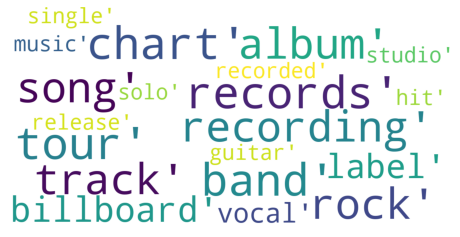

Label:  218 . Number of documents:  961 . Top words:
[('tell', 0.00576453808228094), ('get', 0.0035170807903554717), ('movie', 0.003409954262389565), ('find', 0.0033953231538951943), ('go', 0.0031850867171646906), ('jack', 0.003130527001991856), ('asks', 0.0030565739690543666), ('scene', 0.0028496760161933823), ('try', 0.002836310331885994), ('jax', 0.0028234334590807866), ('plot', 0.0028057825382199588), ('episode', 0.002677859822562071), ('relationship', 0.0026638144025772025), ('friend', 0.002649647939316034), ('want', 0.0026322770312804636), ('chuck', 0.0026316768372631793), ('max', 0.002487069532090764), ('decides', 0.0024793947789755796), ('kill', 0.0024382423310841473), ('tony', 0.0024348979004189947)]


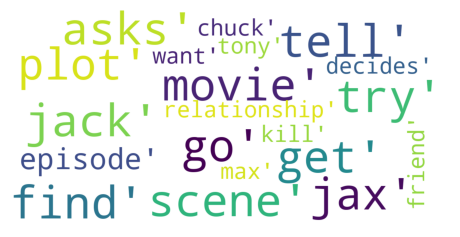

Label:  160 . Number of documents:  783 . Top words:
[('bollywood', 0.009867875540320311), ('hindi', 0.007727082653807469), ('kumar', 0.007489420638768233), ('kapoor', 0.007181244609791794), ('movie', 0.007099197997454368), ('tamil', 0.0070821980526030335), ('indian', 0.006809197673813701), ('mumbai', 0.0063123607843487166), ('telugu', 0.006105159089752806), ('actor', 0.005696738517093105), ('malayalam', 0.005351277078587393), ('khan', 0.005197751347053374), ('directed', 0.004951290473397541), ('filmfare', 0.004940148480183711), ('vijay', 0.004603333224684196), ('india', 0.0045810367990424625), ('actress', 0.004138169300822266), ('director', 0.0041319458806717045), ('shankar', 0.0041237880221763334), ('cinema', 0.004099039043845468)]


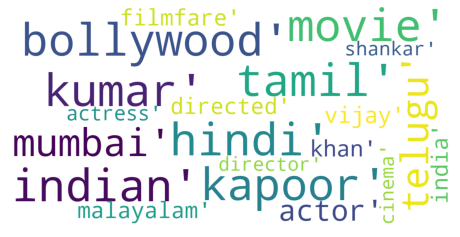

In [106]:
for label, num in zip(df_top_clusters.loc[1:3,'labels'].tolist(), df_top_clusters.loc[1:3,'num_of_docs'].tolist()):
    print("Label: ", label, ". Number of documents: ", num, ". Top words:")
    print(top_n_words[label])
    show_wordcloud(top_n_words[label])
    plt.show()

Label:  98 . Number of documents:  25 . Top words:
[('prostitution', 0.0812569771687779), ('sex', 0.041432266376527166), ('trafficking', 0.03330062337869277), ('prostitute', 0.03084711488590093), ('brothel', 0.02821302706088113), ('smuggling', 0.021539512006483057), ('thailand', 0.014411738575087726), ('worker', 0.014235584288545232), ('sexual', 0.011483693864361879), ('trafficked', 0.010731691266843084), ('illegal', 0.010136569186300175), ('farley', 0.007986228940448457), ('somaly', 0.0077500468806729625), ('mam', 0.0073083037755917344), ('woman', 0.0071686416955376855), ('exploitation', 0.007070705506705923), ('victim', 0.007060562185021297), ('escort', 0.007038295678279666), ('trafficker', 0.0070049132182723175), ('massage', 0.0065670629811550914)]


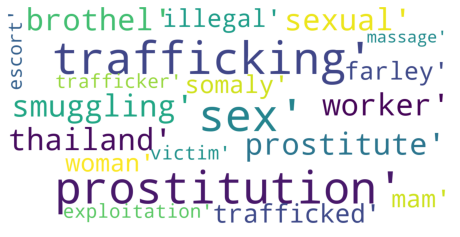

Label:  200 . Number of documents:  25 . Top words:
[('oblast', 0.06574278692348809), ('kaluga', 0.0352265713298179), ('novosibirsk', 0.027016592063604676), ('crimea', 0.025383697439170443), ('krai', 0.02479663990984693), ('vladivostok', 0.023631246719622218), ('crimean', 0.020578166550927476), ('zaporizhia', 0.014705037632833711), ('melitopol', 0.014124250211362693), ('russian', 0.013094373689356292), ('bryansk', 0.012031014680482571), ('dnieper', 0.011915753415314338), ('krasnoyarsk', 0.011034231509182238), ('ukraine', 0.010728144736503693), ('administrative', 0.010718338422401358), ('mln', 0.010695824724104509), ('russia', 0.010120847763465592), ('pyatigorsk', 0.007902077099552868), ('locality', 0.007873436878292091), ('industrial', 0.007637738789061377)]


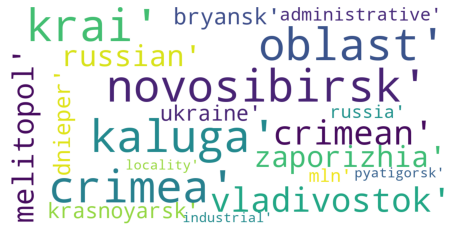

Label:  21 . Number of documents:  25 . Top words:
[('snooker', 0.045648371135285824), ('cue', 0.0401235069545368), ('ball', 0.03885888568759498), ('billiards', 0.022491418820870607), ('championship', 0.02016433394836581), ('pdc', 0.016814351134871747), ('chisnall', 0.01643571782082414), ('darts', 0.0161531029082577), ('pool', 0.016006357547188994), ('nineball', 0.015813216817215363), ('doherty', 0.015349490491699222), ('pagulayan', 0.014640453303328886), ('jenkins', 0.014215702651577256), ('ranking', 0.01393255144174979), ('tournament', 0.013671310454147241), ('bristow', 0.013525881434432407), ('billiard', 0.013266369881020227), ('thorburn', 0.012263015787769907), ('players', 0.01184844746019119), ('bca', 0.01112442842157245)]


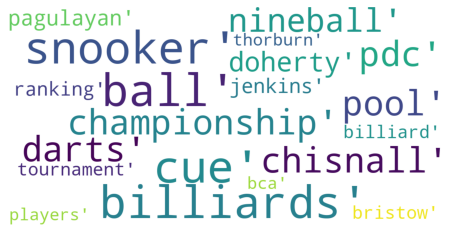

In [107]:
for label, num in zip(df_top_clusters.loc[df_top_clusters.shape[0]-3:df_top_clusters.shape[0]-1,'labels'].tolist(), df_top_clusters.loc[df_top_clusters.shape[0]-3:df_top_clusters.shape[0]-1,'num_of_docs'].tolist()):
    print("Label: ", label, ". Number of documents: ", num, ". Top words:")
    print(top_n_words[label])
    show_wordcloud(top_n_words[label])
    plt.show()

# Topic models assessment

In [139]:
res_npmi = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/results_c_npmi.csv', sep = '|')
res_npmi.drop(['Unnamed: 0'], axis = 1, inplace = True)
res_npmi = res_npmi.reindex([3,0,1,2,4])
res_npmi.columns = ['model', 'num_topic_1', 'c_npmi']
res_npmi.loc[3,'model'] = 'LDA_50'
res_npmi.loc[0,'model'] = 'LDA_100'
print(res_npmi)

                                         model  num_topic_1    c_npmi
3                                       LDA_50           50  0.084139
0                                      LDA_100          100  0.070138
1             BERTopic (Distilbert Embeddings)          137  0.049583
2  BERTopic (BERT Embeddings all-MiniLM-L6-v2)          175  0.166975
4                                     TopToVec          222  0.152158


In [140]:
res_df = pd.read_csv('/content/drive/MyDrive/FU_NLP_Project/results.csv', sep = '|')
res_df.drop(['Unnamed: 0'], axis = 1, inplace = True)
res_df = res_df.reindex([1,0,2,3,4])
res_df.columns = ['model', 'num_topic_2', 'c_v']
res_df.loc[1,'model'] = 'LDA_50'
res_df.loc[0,'model'] = 'LDA_100'
print("Recalculation with c_v coherence measure:")
print(res_df)

Recalculation with c_v coherence measure:
                                         model  num_topic_2       c_v
1                                       LDA_50           50  0.592686
0                                      LDA_100          100  0.601887
2             BERTopic (Distilbert Embeddings)          127  0.559509
3  BERTopic (BERT Embeddings all-MiniLM-L6-v2)          183  0.722381
4                                     TopToVec          223  0.786265


In [148]:
df = pd.merge(res_npmi, res_df, on='model' )
df

,model,num_topic_1,c_npmi,num_topic_2,c_v
0,LDA_50,50,0.084139,50,0.592686
1,LDA_100,100,0.070138,100,0.601887
2,BERTopic (Distilbert Embeddings),137,0.049583,127,0.559509
3,BERTopic (BERT Embeddings all-MiniLM-L6-v2),175,0.166975,183,0.722381
4,TopToVec,222,0.152158,223,0.786265


Coherence measure by model


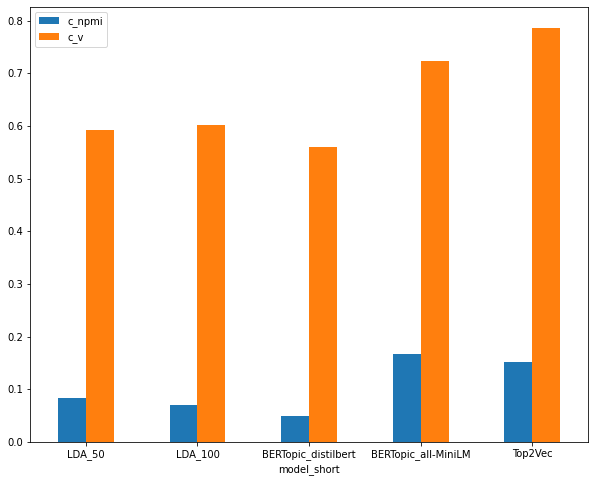

In [150]:

df["model_short"] = ['LDA_50','LDA_100','BERTopic_distilbert','BERTopic_all-MiniLM', 'Top2Vec']
print("Coherence measure by model")

df.plot.bar( x='model_short', y=['c_npmi','c_v'],figsize = (10,8), rot=0)

plt.show()

Number of topics by model in 1st and 2nd iteration of topic modeling


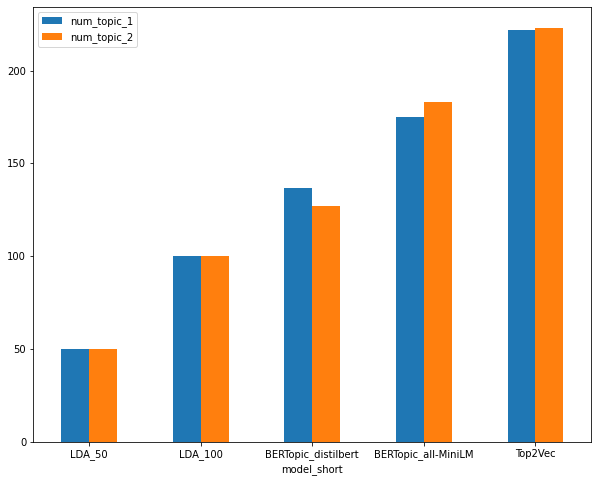

In [151]:
print("Number of topics by model in 1st and 2nd iteration of topic modeling")

df.plot.bar( x='model_short', y=['num_topic_1','num_topic_2'],figsize = (10,8), rot=0)

plt.show()

The model BERTopic with "all-MiniLM" embeddings and the highest number of topics (175) showed the highest value of the coherence measure. Second result showed Top2Vec model. The topics with the largest number of words according to BERTopic with "all-MiniLM" embeddings and Top2Vec are quite similar (Music, Movies and TV, Bolywood and Music, Bollywood and Religion). 


LDA with number of topics = 50 had the highest coherence value amoung LDA models with 50, 70, 100,  200 and 300 topics and still is much lower than the coherence value of BERTopic and Top2Vec.